#  STAT 301  Final Report

### Group 14


**Group Memebers:**

Pragya Singhal <br>
Helen He <br>
Zohane Bal <br>
Kenny Zhou


## Unveiling Melbourne's Housing Market Dynamics: 
### A Predictive Analysis during the 2016-2018 Bubble Period

### Loading Packages

In [1]:
library(tidyverse)
library(repr)
library(infer)
library(cowplot)
library(dplyr)
library(broom)
library(ggplot2)
library(GGally)
library(MASS)
library(rsample)
library(leaps)
library(scales)
library(caret)

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.3     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.0
✔ ggplot2   3.4.3     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.0
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors

Attaching package: ‘cowplot’


The following object is masked from ‘package:lubridate’:

    stamp


Registered S3 method overwritten by 'GGally':
  method from   
  +.gg   ggplot2


Attaching package: ‘MASS’


The following object is masked from ‘package:dplyr’:

    select



Attaching package: ‘scales’


The following object is masked from ‘package:purrr’:

    discard


The following object is masked from ‘package:readr’:

    col_factor


Loading required package: l

## Reading Data into R

We read the data into R from the web 

In [2]:
data <- read.csv("https://raw.githubusercontent.com/HelenXuanye-He/STATS-301-PROJECT/31530efd259e32800656c74548b51d5070896578/Melbourne_housing_FULL.csv")
head(data)

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,⋯,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
,<chr>,<chr>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<int>,<int>,<dbl>,<int>,<chr>,<dbl>,<dbl>,<chr>,<chr>
1,Abbotsford,68 Studley St,2,h,NA,SS,Jellis,3/09/2016,2.5,3067,⋯,1,1,126,NA,NA,Yarra City Council,-37.8014,144.9958,Northern Metropolitan,4019
2,Abbotsford,85 Turner St,2,h,1480000,S,Biggin,3/12/2016,2.5,3067,⋯,1,1,202,NA,NA,Yarra City Council,-37.7996,144.9984,Northern Metropolitan,4019
3,Abbotsford,25 Bloomburg St,2,h,1035000,S,Biggin,4/02/2016,2.5,3067,⋯,1,0,156,79,1900,Yarra City Council,-37.8079,144.9934,Northern Metropolitan,4019
4,Abbotsford,18/659 Victoria St,3,u,NA,VB,Rounds,4/02/2016,2.5,3067,⋯,2,1,0,NA,NA,Yarra City Council,-37.8114,145.0116,Northern Metropolitan,4019
5,Abbotsford,5 Charles St,3,h,1465000,SP,Biggin,4/03/2017,2.5,3067,⋯,2,0,134,150,1900,Yarra City Council,-37.8093,144.9944,Northern Metropolitan,4019
6,Abbotsford,40 Federation La,3,h,850000,PI,Biggin,4/03/2017,2.5,3067,⋯,2,1,94,NA,NA,Yarra City Council,-37.7969,144.9969,Northern Metropolitan,4019


# Introduction

Our dataset ("Melbourne Housing Market", sourced from Kaggle: https://www.kaggle.com/datasets/anthonypino/melbourne-housing-market) captures property sales in Melbourne from March 2016 to December 2018, which was a period known as a housing bubble. A housing bubble is a phenomenon where house prices go up successively because of an increase in demand (Case & Shiller, 2003). Demand later decreases while supply increases, which results in a sharp drop in prices and indicates the burst of the bubble (Case & Shiller, 2003). During the 2016-2018 housing bubble, Melbourne’s housing market experienced this full process with a large increase and drop in housing prices. 

In this project, we will conduct predictive analysis to determine factors that exert the most influence on property prices within the Melbourne housing market during the 2016-2018 bubble. After a preliminary data cleaning phase, where we omitted observations with missing values in the explanatory variables, the population size for this study stands at 8,887 house sales. This refined dataset serves as the basis for the subsequent predictive modeling.

One important consideration is the risk of overfitting if we include too many variables in the analysis, particularly when dealing with datasets that have a limited number of observations. Thus, in this project, we are going to limit our explanatory variables to 2 broad categories: location (distance from the Melbourne CBD, region) and house features (property type, number of bathrooms, number of bedrooms, and number of car spots). 

We will use a stepwise AIC method to validate our model choices, since this method can be applied to non-normally distributed data such as the housing prices (response variable) in our dataset (Yamashita et. al, 2007).

### Research Question 

Which combination of explanatory variables best predict property prices during the 2016-2018 Melbourne housing bubble?

## Key Variables 

|Variable Name|Description|Variable Type|
|-------------|-----------|----|
|`Price`|The price of the property in Australian dollars|Numerical variable|
|`Type`|The type of property: h,u,t. Where h stands for houses, cottages, villas, semis, terraces; u stands for apartments, duplex; t stands for townhouses|Categorical variable|
|`Method`| Methods of sale ,S - property sold; SP - property sold prior; PI - property passed in; PN - sold prior not disclosed; SN - sold not disclosed; NB - no bid; VB - vendor bid; W - withdrawn prior to auction; SA - sold after auction; SS - sold after auction price not disclosed | Categorical variable|
|`Distance`| The distance from the property to the Central Business District (CBD) of Melbourne, measured in kilometers| Numerical variable|
|`Rooms`| Number of rooms in the house| Numerical variable|
|`Bedroom2`| Number of bedrooms in the house | Numerical variable|
|`Bathroom`| Number of bathrooms in the house| Numerical variable|
|`Car`| Number of car spots| Numerical variable|
|`landsize`| Land Size in Metres| Numerical variable|
|`BuildingArea`| Building Size in Metres|Numerical variable|
|`YearBuilt`| Year the house was built|Numerical variable|
|`Regionname`| The general region where the property is located (e.g., West, North West, North, North East). |Categorical variable|


# Methods and Results

## a) Exploratory Data Analysis

### Structure of the objects

In [3]:
str(data)

'data.frame':	34857 obs. of  21 variables:
 $ Suburb       : chr  "Abbotsford" "Abbotsford" "Abbotsford" "Abbotsford" ...
 $ Address      : chr  "68 Studley St" "85 Turner St" "25 Bloomburg St" "18/659 Victoria St" ...
 $ Rooms        : int  2 2 2 3 3 3 4 4 2 2 ...
 $ Type         : chr  "h" "h" "h" "u" ...
 $ Price        : int  NA 1480000 1035000 NA 1465000 850000 1600000 NA NA NA ...
 $ Method       : chr  "SS" "S" "S" "VB" ...
 $ SellerG      : chr  "Jellis" "Biggin" "Biggin" "Rounds" ...
 $ Date         : chr  "3/09/2016" "3/12/2016" "4/02/2016" "4/02/2016" ...
 $ Distance     : chr  "2.5" "2.5" "2.5" "2.5" ...
 $ Postcode     : chr  "3067" "3067" "3067" "3067" ...
 $ Bedroom2     : int  2 2 2 3 3 3 3 3 4 3 ...
 $ Bathroom     : int  1 1 1 2 2 2 1 2 1 2 ...
 $ Car          : int  1 1 0 1 0 1 2 2 2 1 ...
 $ Landsize     : int  126 202 156 0 134 94 120 400 201 202 ...
 $ BuildingArea : num  NA NA 79 NA 150 NA 142 220 NA NA ...
 $ YearBuilt    : int  NA NA 1900 NA 1900 NA 2014 2006 1

### Summary Statistics

In [4]:
data_summary <- summary(data) 
data_summary

    Suburb            Address              Rooms            Type          
 Length:34857       Length:34857       Min.   : 1.000   Length:34857      
 Class :character   Class :character   1st Qu.: 2.000   Class :character  
 Mode  :character   Mode  :character   Median : 3.000   Mode  :character  
                                       Mean   : 3.031                     
                                       3rd Qu.: 4.000                     
                                       Max.   :16.000                     
                                                                          
     Price             Method            SellerG              Date          
 Min.   :   85000   Length:34857       Length:34857       Length:34857      
 1st Qu.:  635000   Class :character   Class :character   Class :character  
 Median :  870000   Mode  :character   Mode  :character   Mode  :character  
 Mean   : 1050173                                                           
 3rd Qu.: 12950

### Removing NA Values

In [5]:
melbourne_housing <- na.omit(data)

head(melbourne_housing)
nrow(melbourne_housing)

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,⋯,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
,<chr>,<chr>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<int>,<int>,<dbl>,<int>,<chr>,<dbl>,<dbl>,<chr>,<chr>
3,Abbotsford,25 Bloomburg St,2,h,1035000,S,Biggin,4/02/2016,2.5,3067,⋯,1,0,156,79,1900,Yarra City Council,-37.8079,144.9934,Northern Metropolitan,4019
5,Abbotsford,5 Charles St,3,h,1465000,SP,Biggin,4/03/2017,2.5,3067,⋯,2,0,134,150,1900,Yarra City Council,-37.8093,144.9944,Northern Metropolitan,4019
7,Abbotsford,55a Park St,4,h,1600000,VB,Nelson,4/06/2016,2.5,3067,⋯,1,2,120,142,2014,Yarra City Council,-37.8072,144.9941,Northern Metropolitan,4019
12,Abbotsford,124 Yarra St,3,h,1876000,S,Nelson,7/05/2016,2.5,3067,⋯,2,0,245,210,1910,Yarra City Council,-37.8024,144.9993,Northern Metropolitan,4019
15,Abbotsford,98 Charles St,2,h,1636000,S,Nelson,8/10/2016,2.5,3067,⋯,1,2,256,107,1890,Yarra City Council,-37.8060,144.9954,Northern Metropolitan,4019
19,Abbotsford,10 Valiant St,2,h,1097000,S,Biggin,8/10/2016,2.5,3067,⋯,1,2,220,75,1900,Yarra City Council,-37.8010,144.9989,Northern Metropolitan,4019


[1] 8887

### Looking at Head & Tail of Data

In [6]:
data_head <- melbourne_housing %>% head(3)
data_tail <- melbourne_housing %>% tail(3)
data_head
data_tail

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,⋯,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
,<chr>,<chr>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<int>,<int>,<dbl>,<int>,<chr>,<dbl>,<dbl>,<chr>,<chr>
3,Abbotsford,25 Bloomburg St,2,h,1035000,S,Biggin,4/02/2016,2.5,3067,⋯,1,0,156,79,1900,Yarra City Council,-37.8079,144.9934,Northern Metropolitan,4019
5,Abbotsford,5 Charles St,3,h,1465000,SP,Biggin,4/03/2017,2.5,3067,⋯,2,0,134,150,1900,Yarra City Council,-37.8093,144.9944,Northern Metropolitan,4019
7,Abbotsford,55a Park St,4,h,1600000,VB,Nelson,4/06/2016,2.5,3067,⋯,1,2,120,142,2014,Yarra City Council,-37.8072,144.9941,Northern Metropolitan,4019


,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,⋯,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
,<chr>,<chr>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<int>,<int>,<dbl>,<int>,<chr>,<dbl>,<dbl>,<chr>,<chr>
34854,Yarraville,29A Murray St,2,h,888000,SP,Sweeney,24/02/2018,6.3,3013,⋯,2,1,98,104,2018,Maribyrnong City Council,-37.81551,144.8883,Western Metropolitan,6543
34855,Yarraville,147A Severn St,2,t,705000,S,Jas,24/02/2018,6.3,3013,⋯,1,2,220,120,2000,Maribyrnong City Council,-37.82286,144.8786,Western Metropolitan,6543
34857,Yarraville,3 Tarrengower St,2,h,1020000,PI,RW,24/02/2018,6.3,3013,⋯,1,0,250,103,1930,Maribyrnong City Council,-37.81810,144.8935,Western Metropolitan,6543


### Exploring the Data with Visualizations

#### Price by Property Type

`geom_smooth()` using formula = 'y ~ x'


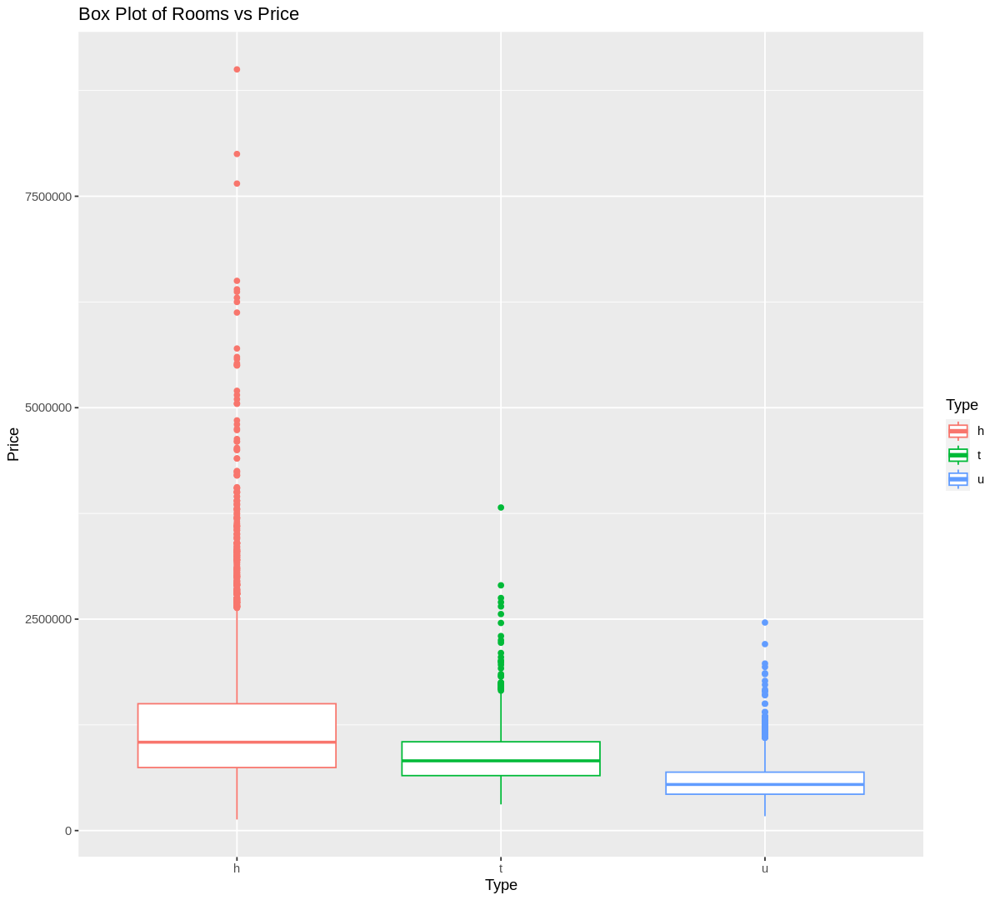

In [7]:
options(repr.plot.width = 10, repr.plot.height = 9)

bathroom_vs_price <- ggplot(melbourne_housing, aes(x = Type, y = Price, color = Type)) +
    geom_boxplot() + 
    geom_smooth(method = lm, se = FALSE, linewidth = 1.5) + 
    labs(title = "Box Plot of Rooms vs Price", x = "Type", y = "Price")

bathroom_vs_price 

*Figure 1: Box plot comparison of housing prices by type of property*

> Among the property types depicted, houses command the highest median price of around 180K AUD, with several outliers reaching well beyond 750K AUD, indicating exceptional high-priced properties. In contrast, town and unit properties show lower medians and fewer extreme outliers, suggesting a more constrained price range and fewer exceptionally high-priced instances.

#### Number of Bathrooms vs. Price by Type

`geom_smooth()` using formula = 'y ~ x'


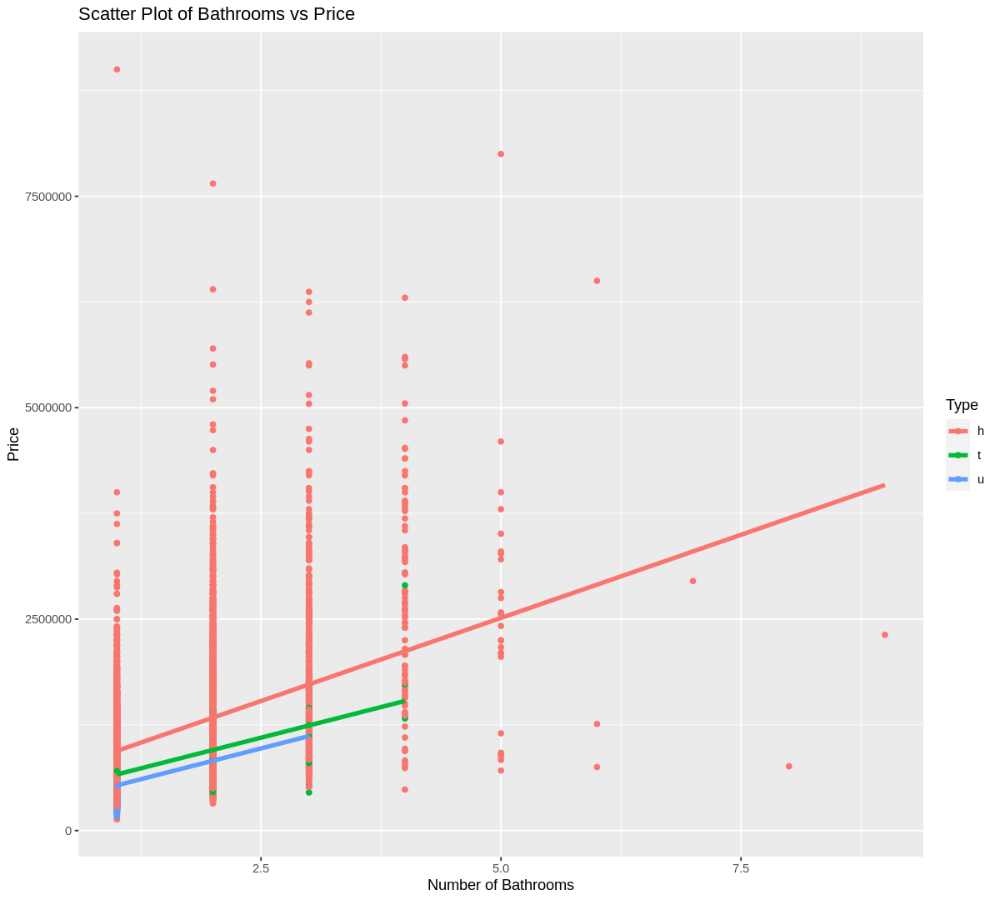

In [8]:
options(repr.plot.width = 10, repr.plot.height = 9)

bathroom_vs_price <- ggplot(melbourne_housing, aes(x = Bathroom, y = Price, color = Type)) +
  geom_point() +
  geom_smooth(method = lm, se = FALSE, linewidth = 1.5)+
  labs(title = "Scatter Plot of Bathrooms vs Price", x = "Number of Bathrooms", y = "Price")

bathroom_vs_price 

*Figure 2: Scatter plot of housing prices versus number of bathrooms*

#### Linear Correlation Coefficient

In [9]:
cor(melbourne_housing$Price, melbourne_housing$Bathroom)

[1] 0.463501

> The plot offers insights into the relationship between the number of rooms in Melbourne housing and their prices, aiding in understanding whether a linear or non-linear correlation exists. On average, the price tends to increase with the number of bedrooms, aligning with our initial expectation of a linearly increasing trend. The calculated linear correlation coefficient between price and distance is 0.463, suggesting a weak positive correlation between these variables.

> Additionally, the 'Type' variable is represented by color in the scatter plot, effectively distinguishing among the three property types visually. This visualization quickly illustrates the distribution of different property types concerning the number of rooms and their respective prices. From the plot, we can infer that a majority of the housing in Melbourne are defined by the type 'Houses' and also have a higher price range than the others, which was also inferred from the previous boxplot.

#### Number of Bedrooms vs Price by Type

`geom_smooth()` using formula = 'y ~ x'


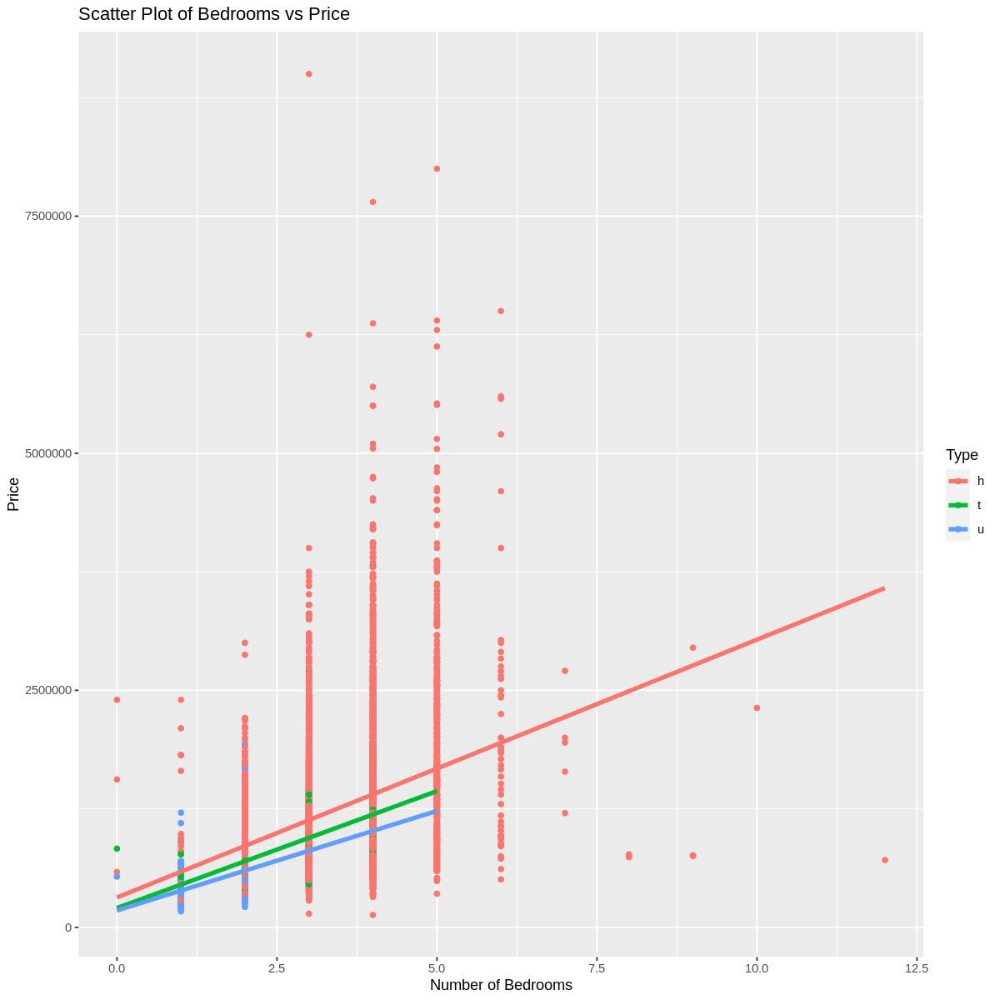

In [10]:
options(repr.plot.width = 10, repr.plot.height = 10)

bedroom_vs_price <- ggplot(melbourne_housing, aes(x = Bedroom2, y = Price, color = Type)) +
  geom_point() +
  geom_smooth(method = lm, se = FALSE, linewidth = 1.5)+
  labs(title = "Scatter Plot of Bedrooms vs Price", x = "Number of Bedrooms", y = "Price")

bedroom_vs_price 

*Figure 3: Scatter plot of housing prices versus number of bedrooms*

#### Linear Correlation Coefficient

In [11]:
cor(melbourne_housing$Price, melbourne_housing$Bedroom2)

[1] 0.4608804

> From the above plot, there is a clear increasing trend observed as the number of bedrooms in a house increases, correlating with a rise in housing prices. This relationship is supported by a moderate positive linear correlation coefficient of 0.433 between the price and the number of bedrooms. 

> Examining the data distribution reveals interesting patterns: a clustering of data points occurs at lower bedroom counts, while houses with more than eight bedrooms show a wider spread. Notably, there's considerable price variability among houses with 4-5 bedrooms, indicating that the fitted linear regression line doesn't fully capture this diversity in prices. Despite the general trend aligning with the common notion that more bedrooms usually mean higher prices, exceptions exist. 

> Moreover, the scatter plot's use of color to represent the 'Type' variable effectively distinguishes among different property types, facilitating a quick understanding of their distribution based on room count and prices. This visualization highlights that a majority of Melbourne's housing is categorized as 'Houses,' which tend to command higher prices compared to other property types

#### Distance to Central Business District (CBD) vs. House Price in Melbourne

`geom_smooth()` using formula = 'y ~ x'


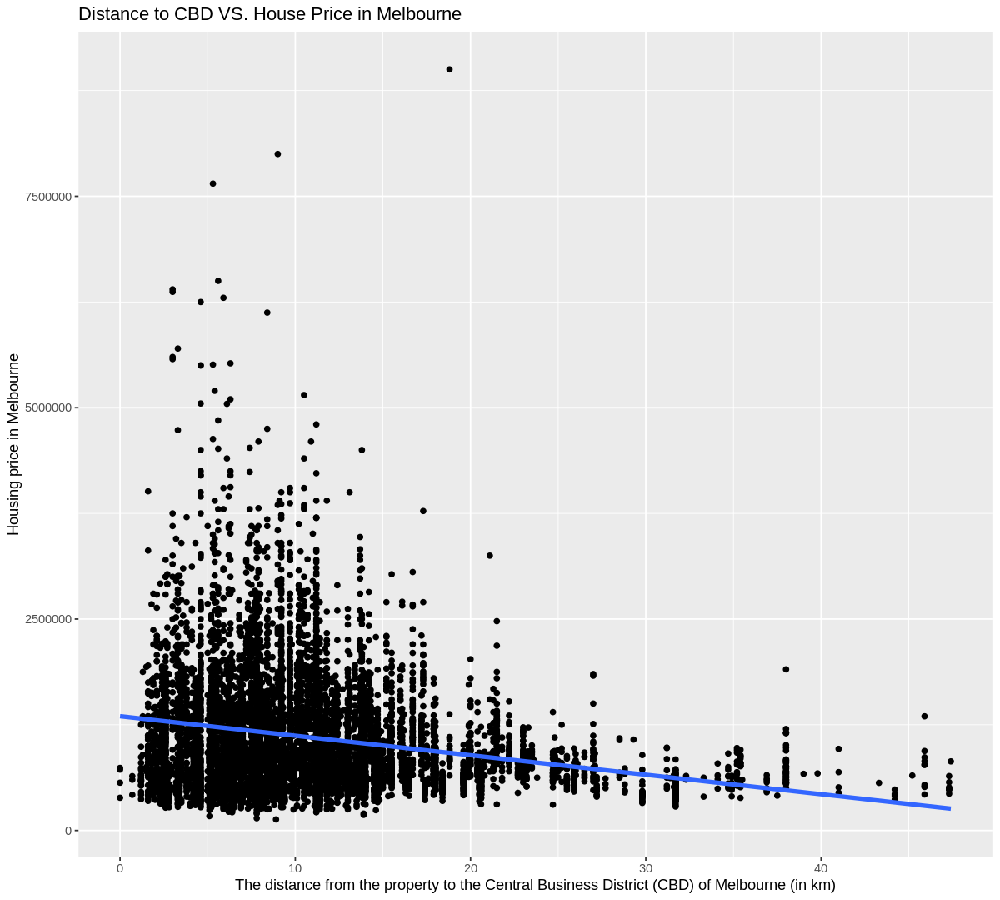

In [12]:
options(repr.plot.width = 10, repr.plot.height = 9)
melbourne_housing$Distance <- as.double(melbourne_housing$Distance)

PriceVSDistance <- ggplot(data=melbourne_housing, aes(x=Distance, y=Price)) + 
    geom_point() + 
    geom_smooth(method = lm, se = FALSE, linewidth = 1.5) +
    xlab("The distance from the property to the Central Business District (CBD) of Melbourne (in km)") +
    ylab("Housing price in Melbourne") +
    ggtitle("Distance to CBD VS. House Price in Melbourne")
PriceVSDistance

*Figure 4: Scatter plot of housing prices versus distance from Melborune CBD*

#### Linear Correlation Coefficient

In [13]:
cor(melbourne_housing$Price, melbourne_housing$Distance)

[1] -0.2312117

> The plot above reveals a noticeable decreasing trend: as the distance from Melbourne's Central Business District (CBD) increases, housing prices tend to decline. This relationship is supported by a weak negative linear correlation coefficient of -0.231 between the price and distance variables. The observed trend aligns with the general understanding that properties closer to the CBD typically command higher prices, a notion that seems logical and often serves as a reliable predictor. However, as with any trend, there are occasional deviations or exceptions.

#### Number of Car Spots vs. Price

`geom_smooth()` using formula = 'y ~ x'


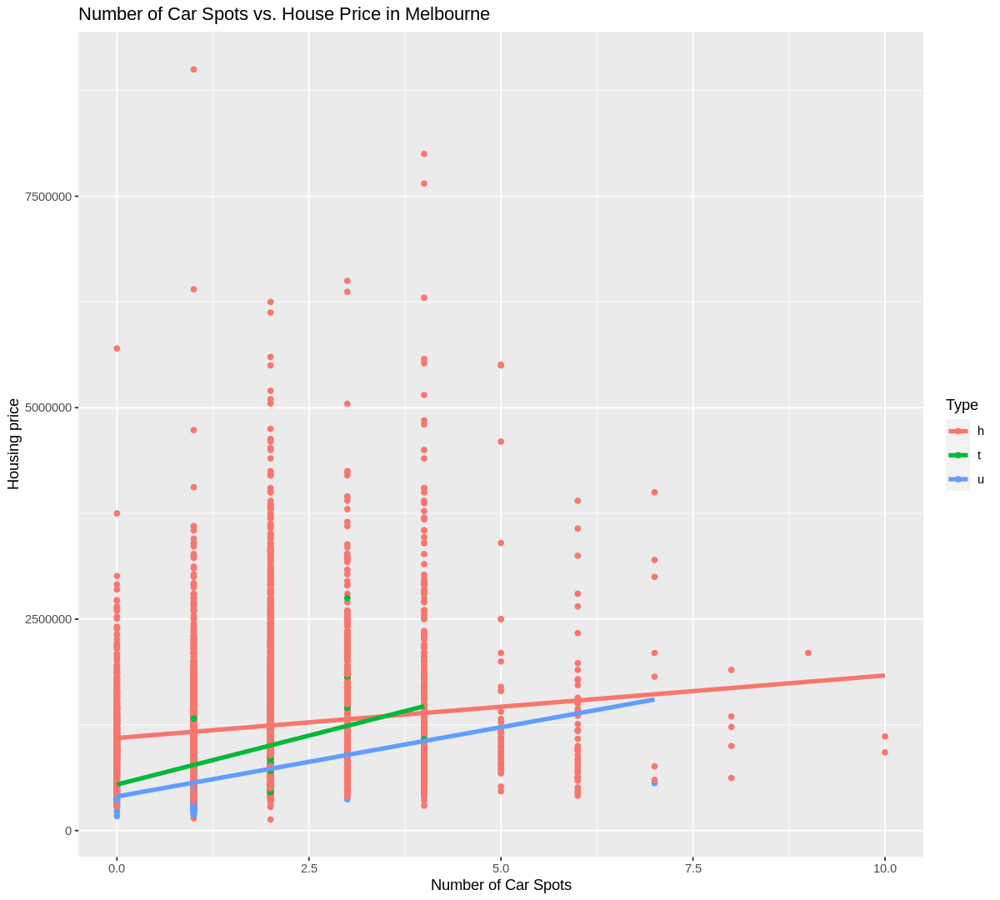

In [14]:
options(repr.plot.width = 10, repr.plot.height = 9)

PriceVSCar <- ggplot(data=melbourne_housing, aes(x=Car, y=Price, color = Type)) + 
    geom_point() + 
    geom_smooth(method = lm, se = FALSE, linewidth = 1.5) +
    xlab("Number of Car Spots")+
    ylab("Housing price")+
    ggtitle("Number of Car Spots vs. House Price in Melbourne")
PriceVSCar

*Figure 5: Scatter plot of housing prices versus number of car spots*

#### Linear Correlation Coefficent

In [15]:
cor(melbourne_housing$Price, melbourne_housing$Car)

[1] 0.2094641

> The presented plot highlights a notable trend: an increase in the number of parking spaces in a house tends to correlate with higher housing prices, supported by a weak positive linear correlation coefficient of 0.209 between price and the quantity of car spots. However, within the 1-6 car spot range, numerous outliers are apparent. These outliers likely indicate properties possessing distinct characteristics or amenities that significantly impact their value, surpassing the typical influence attributed solely to parking availability. Notably, property type plays a significant role; 'House' type residences show more deviations from the expected trend, suggesting that property type strongly influences market value, even beyond the influence of available car spots.

#### Boxplot comparison of property prices by Melbourne region

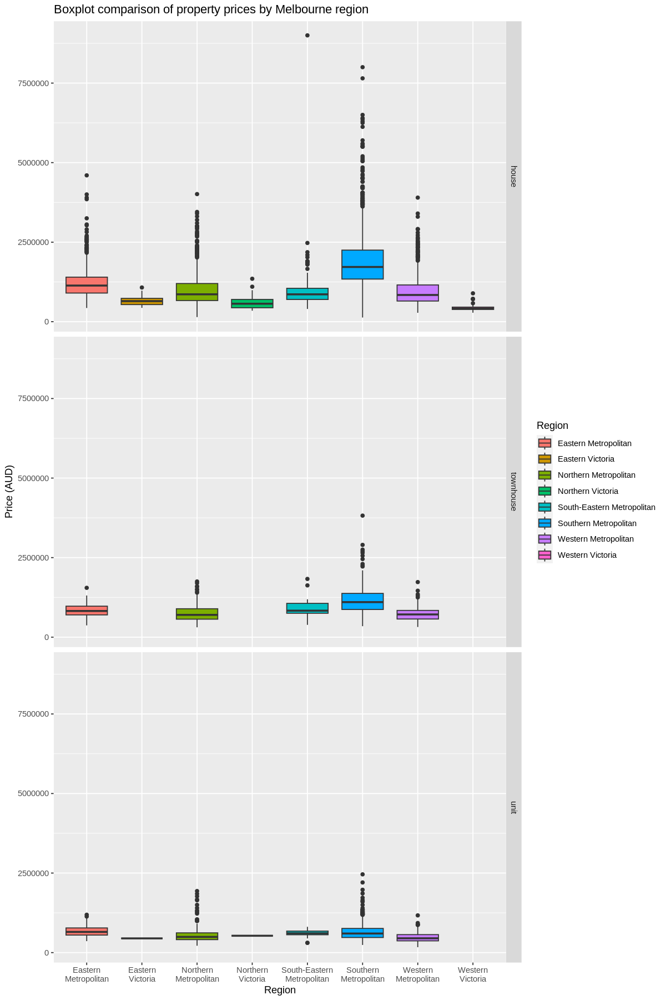

In [16]:
options(repr.plot.width = 10, repr.plot.height = 15)
house_prices_by_region_and_type_plot <- ggplot(melbourne_housing, aes(x = Regionname, y = Price, fill = Regionname)) + 
    geom_boxplot() + 
    facet_grid(rows = "Type", labeller = as_labeller(c(h = "house", t = "townhouse", u = "unit"))) +
    labs(x = "Region", y = "Price (AUD)", title = "Boxplot comparison of property prices by Melbourne region", fill = "Region") +
    scale_x_discrete(labels = wrap_format(10))
house_prices_by_region_and_type_plot

*Figure 6: Box plot comparison of housing prices versus region, stratified by property type*

> This box plot illustrates housing price distributions across various regions, serving as a valuable tool to discern price disparities among regions based on property types, a crucial factor in predicting housing prices. Notably, 'unit' property types exhibit minimal price variation across regions, with occasional outliers observed in the southern and northern metropolitan areas, where unit prices soar to 250K AUD in the Southern Metropolitan region.

>In contrast, 'house' property types display more price diversity across regions. For instance, the Southern Metropolitan area notably contains a cluster of houses priced between 200K-250K AUD, with the median falling within this range. Other regions typically showcase median prices below 200K AUD, with Northern Victoria hosting the most affordable properties across all property types.

>The Southern Metropolitan region stands out for its higher-priced properties, with outliers surpassing 750K AUD. This explanatory variable significantly influences property price fluctuations and serves as a potential area of exploration in order to look for more affordable housing options elsewhere.

### b) Methods: Plan

**Feature selection**

First, we select predictor variables to include in our predictive model using stepwise AIC hybrid selection.

In [17]:
formula <- lm(Price ~ Distance+Bedroom2+Bathroom+Car+Regionname+Type, data = melbourne_housing)
stepwise.model <- stepAIC(formula, direction = "both")

Start:  AIC=230661.8
Price ~ Distance + Bedroom2 + Bathroom + Car + Regionname + Type

             Df  Sum of Sq        RSS    AIC
<none>                     1.6576e+15 230662
- Car         1 1.6825e+13 1.6745e+15 230750
- Bedroom2    1 9.7395e+13 1.7550e+15 231167
- Bathroom    1 1.0827e+14 1.7659e+15 231222
- Type        2 2.8605e+14 1.9437e+15 232073
- Distance    1 4.7202e+14 2.1296e+15 232887
- Regionname  7 6.3091e+14 2.2885e+15 233514


*Table 1: Models generated by stepwise AIC selection and their statistics (AIC, RSS, etc.). This selection process starts from the model with all explanatory variables and removes a variable in each iteration.*

From the results above, we see that the full additive model with all predictor variables has the lowest AIC (230662) out of all models generated above (from removing predictors one at a time). Therefore, out of all models generated above, the initial full model best fits data from the dataset. 

To confirm that this model is also the best at out-of-sample prediction, we then compare $C_p$ statistics between different models below (by performing an exhaustive variable selection for each model "size" (number of predictors) using the `regsubsets` function). Note that we will also split our data into training and testing sets, and perform our model selection on training data only. This will allow us to use testing data in a later section to estimate how accurately the model predicts house prices given data it was not trained on.

In [18]:
set.seed(1234)
Housing_split <- initial_split(melbourne_housing, prop = 0.7, strata = Price)
training_Housing <- training(Housing_split)
testing_Housing <- testing(Housing_split)

Housing_stepwise <- regsubsets(
  x = Price ~ Distance+Bedroom2+Bathroom+Car+Regionname+Type,  
  data = training_Housing,
    nvmax = 13,
  method = "exhaustive",  
)

housing_stepwise_summary <- summary(Housing_stepwise)

housing_stepwise_summary_df <- tibble(
    num_expl_vars = 1:length(housing_stepwise_summary$cp),
    Cp = housing_stepwise_summary$cp
)
housing_stepwise_summary_df

num_expl_vars,Cp
<int>,<dbl>
1,5728.91248
2,3262.49215
3,1979.65905
4,1265.06629
5,884.07419
6,586.47924
7,295.93222
8,159.20293
9,100.84734


*Table 2: $C_p$ statistic by number of model explanatory variables*

In [22]:
cp_min = which.min(housing_stepwise_summary$cp) 
selected_var <- tibble(variables = names(coef(Housing_stepwise, cp_min))[-1])
selected_var

variables
<chr>
Distance
Bedroom2
Bathroom
Car
RegionnameEastern Victoria
RegionnameNorthern Metropolitan
RegionnameNorthern Victoria
RegionnameSouth-Eastern Metropolitan
RegionnameSouthern Metropolitan


*Table 3: Model variables (including dummy variables) of the model with minimum $C_p$ statistic*

The results show that the model with all 6 predictor variables, but which excludes the dummy variable for the "Western Victoria" region, has the lowest $C_p$ statistic (12.01708), which suggests this model best predicts the response variable (price) on data outside of the training set. However, as it is not practical to exclude a single region dummy variable from our model, we will select the model that includes all predictors, including all region dummy variables, as our best predictive model given it has the second lowest $C_p$ statistic.

**Assessment of model performance**

Finally, we evaluate how well the model selected above performs on test data. First, we perform 5-fold cross validation and compute the RMSE of our model on the 5 test sets generated.

In [20]:
outer_control <- trainControl(method = "cv", number = 5)
outer_results <- data.frame(fold = integer(0), rmse = numeric(0))


set.seed(123)
melbourne_housing_data <- melbourne_housing %>% 
    dplyr::select(Price, Distance, Bedroom2, Bathroom, Car, Regionname, Type)
outer_folds <- createFolds(melbourne_housing_data$Price, k = 5)


fold_index <- 1
for (fold in outer_folds) {
  training <- melbourne_housing_data[-fold, ]
  testing <- melbourne_housing_data[fold, ]
  

  inner_control <- trainControl(method = "cv", number = 5)

  model <- train(Price ~ ., data = training, method = "lm", trControl = inner_control)
  
  predictions <- predict(model, newdata = testing)
  
  rmse <- sqrt(mean((testing$Price - predictions)^2))
  
  outer_results <- rbind(outer_results, data.frame(fold = fold_index, rmse = rmse))
  fold_index <- fold_index + 1
}

outer_results

fold,rmse
<dbl>,<dbl>
1,482311.9
2,422229.5
3,379582.2
4,425447.6
5,447171.3


*Table 4: Model prediction RMSE for each 5-fold cross validation set*

The next table below compares and summarizes the RMSE of our selected model on our initial training and testing set, as well as the average model RMSE on the 5-old cross validation test sets.

In [21]:
average_rmse <- mean(outer_results$rmse)
training_rmse <- sqrt(mean((training_Housing$Price - predict(model, training_Housing))^2))
test_rmse <- sqrt(mean((testing_Housing$Price - predict(model, testing_Housing))^2))

rmse_report <- tibble(
  Dataset = c("Training", "5-fold Validation", "Testing"),
  RMSE = c(training_rmse, average_rmse, test_rmse)
)

rmse_report

Dataset,RMSE
<chr>,<dbl>
Training,433542.7
5-fold Validation,431348.5
Testing,428148.7


*Table 5: RMSE of model prediction on training and testing data, as well as average model prediciton RMSE on 5-fold cross validation sets*

The minimal difference between the training, validation, and testing RMSEs suggests that the risk of model overfitting has been mitigated, and the selected model tends to provide consistent predictions for prices on data it was or was not trained on.

# Discussion

Out of all models compared with AIC and $C_p$ statistics, our final model, which includes all explanatory variables (distance from Melbourne's CBD, region, property type, number of bedrooms, bathrooms, and car spots), was found to best predict housing prices during the 2016-2018 Melbourne housing bubble. This aligns with initial expectations of models having more explanatory variables tending to provide more accurate predictions of prices. Our findings also suggest that our model provides consistent prediction of prices on data that it was not trained on (as shown with similar model prediction RMSE on training and testing data). 

While our selected model provides relatively accurate predictions (compared to models with less variables), it could be improved by comparing with models that include other variables in our dataset that we did not explore (e.g. year built, land size, etc.). Including other variables in our stepwise variable selection process could potentially generate models with combinations of variables that may predict housing prices more accurately and consistently than our current selected model.

The implications of our findings are significant for stakeholders in Melbourne's real estate sector. Understanding these market dynamics can help in better forecasting and decision making in issues related to the housing market. For potential buyers and sellers, our analysis provides valuable insights into what factors might influence property values in the future.

For future research, in addition to exploring how well other explanatory variables in our dataset predict housing prices, we could also compare Melbourne's housing market dynamics with other major cities, which could provide broader insights into global real estate trends.


# References

Case, K. E., &amp; Shiller, R. J. (2003). Is there a bubble in the housing market? Brookings Papers on Economic Activity, 2003(2), 299–362. https://doi.org/10.1353/eca.2004.0004

Pino, T. (2018, October 14). Melbourne housing market. Kaggle. http://www.kaggle.com/datasets/anthonypino/melbourne-housing-market

Yamashita, T., Yamashita, K., &amp; Kamimura, R. (2007). A stepwise AIC method for variable selection in linear regression. Communications in Statistics - Theory and Methods, 36(13), 2395–2403. https://doi.org/10.1080/03610920701215639 
